In [4]:
import os
import numpy as np
import matplotlib.pyplot as plt

from scipy.spatial.distance import cosine
from heapq import nsmallest

from skdim.id import FisherS


def load_allen_movie_Data(data_dir='./', movie=1):
    # 30 Hz framerate (30 frames per second)

    if movie == 1:
        parent_folder = os.path.join(data_dir, "AllenInstitute_Movies/output/NM1/VISp/three_session_A/")
    elif movie == 3:
        parent_folder = os.path.join(data_dir, "AllenInstitute_Movies/output/NM3/VISp/three_session_A/")
        
    parent_folder = os.path.join(data_dir, "example_data/output_movie_3/output/NM3/VISp/three_session_A")
    
    structured_data = []
    
    # Get all subfolders in the parent folder
    for subfolder_name in os.listdir(parent_folder):
        print(subfolder_name)
        subfolder_path = os.path.join(parent_folder, subfolder_name)
        
        # Ensure it's a directory
        if os.path.isdir(subfolder_path):
            subfolder_data = {"subfolder": subfolder_name, "files": []}
            
            # List all CSV files in the subfolder
            for file_name in os.listdir(subfolder_path):
                if file_name.endswith("rep0.csv") and file_name != "metadata.csv":
                    file_path = os.path.join(subfolder_path, file_name)
                    
                    # Load the CSV file into a DataFrame
                    try:
                        data = np.genfromtxt(file_path, delimiter=',').T
                        subfolder_data["files"].append({"file_name": file_name, "data": data})
                    except Exception as e:
                        print(f"Error reading {file_path}: {e}")
            
            structured_data.append(subfolder_data)
    
    
    return structured_data
    
    
load_data = load_allen_movie_Data(data_dir='./', movie=3)

501021421
501729039
501836392
502115959
502205092
502608215
503109347
508356957
508753256
510214538
510517131
511534603
526504941
527048992
528402271
530645663
531348161
540684467
541010698
541290571
545446482
546716391
547388708
561312435
587344053
595806300
596584192
603576132
637669270
643645390
644026238
645413759
647155122
652094901
652842572
653122667
653125130
653932505
657016267
657082055
658536111
661328410
662033243
663485329
664404274
679702884
680156911
683257169
688678766
689388034
702934964


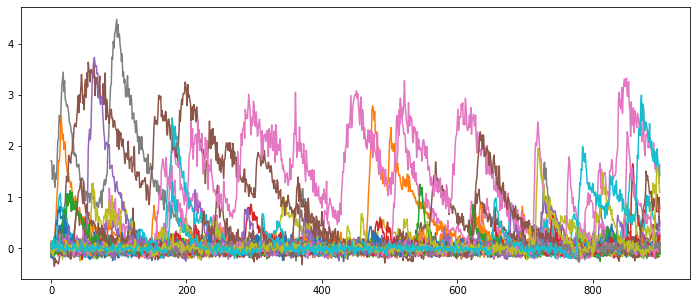

In [2]:
plt.figure(figsize=(12,5))
plt.plot(load_data[0]['files'][0]['data'][:900,:100])
plt.show()

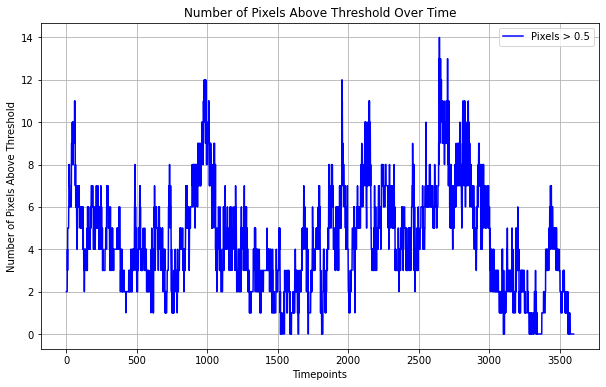

In [3]:
above_threshold_count = np.sum(load_data[0]['files'][0]['data'] > 0.5, axis=1)

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(above_threshold_count, label=f'Pixels > 0.5', color='blue')
plt.title('Number of Pixels Above Threshold Over Time')
plt.xlabel('Timepoints')
plt.ylabel('Number of Pixels Above Threshold')
plt.grid(True)
plt.legend()
plt.show()

In [3]:

timeframe = 80  # Define the timeframe

load_data[0]['files'][0]['data'].shape

(3600, 150)

In [4]:
len(load_data)

51

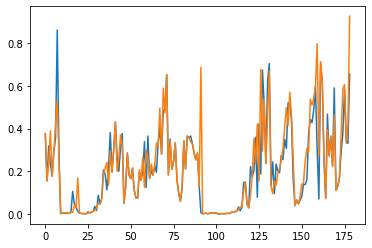

In [6]:


def compute_min_cosine_distances(data, timeframe):
    """
    Compute the minimal cosine distance of each pattern to preceding and following patterns within a timeframe.

    Args:
        data (np.ndarray): Array of shape (n_timepoints, n_pixels).
        timeframe (int): The number of timepoints to consider before and after.

    Returns:
        tuple: Two arrays of shape (n_timepoints,) containing the minimal cosine distances to 
               preceding and following patterns for each timepoint.
    """
    n_timepoints, _ = data.shape
    
    # Initialize arrays to store minimal distances
    min_dist_to_preceding = np.full(n_timepoints, np.inf)
    min_dist_to_following = np.full(n_timepoints, np.inf)
    
    for t in range(n_timepoints):
        # Compute distances to preceding patterns within the timeframe
        for tp in range(max(0, t - timeframe), t):
            distance = cosine(data[t], data[tp])
            min_dist_to_preceding[t] = min(min_dist_to_preceding[t], distance)
        
        # Compute distances to following patterns within the timeframe
        for tf in range(t + 1, min(n_timepoints, t + timeframe + 1)):
            distance = cosine(data[t], data[tf])
            min_dist_to_following[t] = min(min_dist_to_following[t], distance)
    
    return min_dist_to_preceding, min_dist_to_following

# Example usage
n_timepoints, n_pixels = 100, 50
data = np.random.rand(n_timepoints, n_pixels)

min_preceding, min_following = compute_min_cosine_distances(load_data[0]['files'][0]['data'][::5], timeframe)

plt.plot(min_preceding[1:])
plt.plot(min_following[:-1])
plt.show()


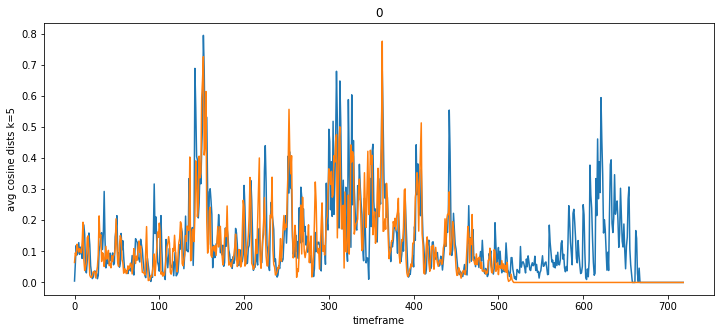

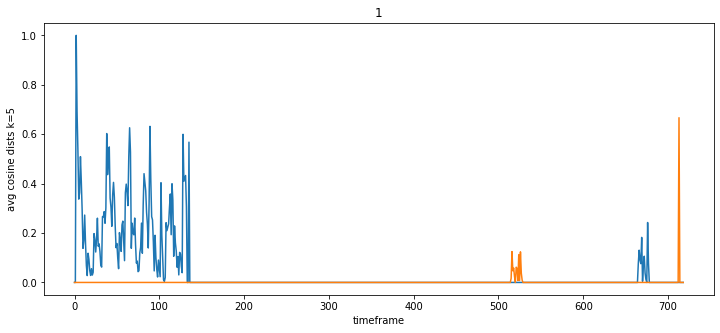

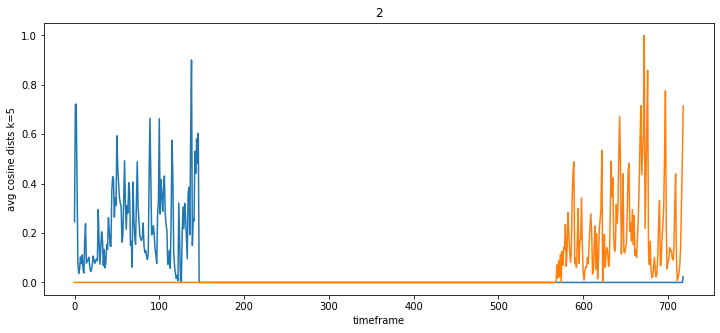

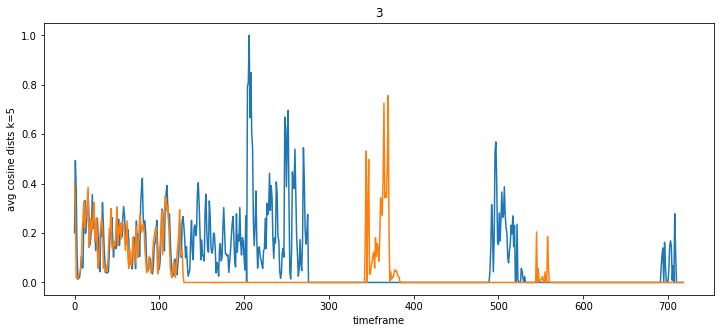

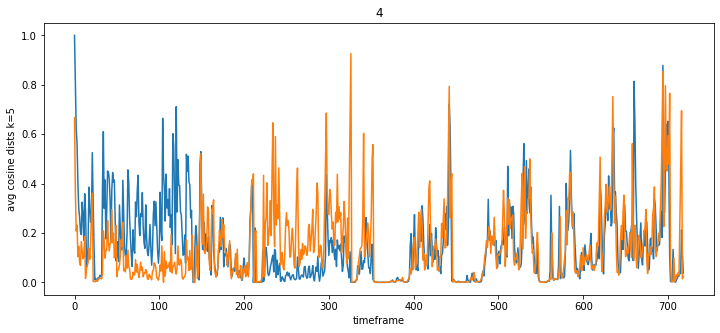

...

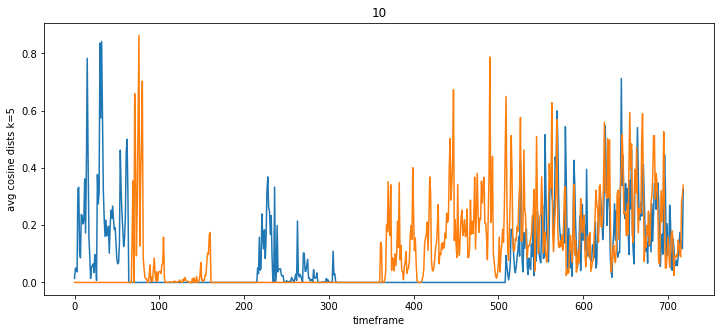

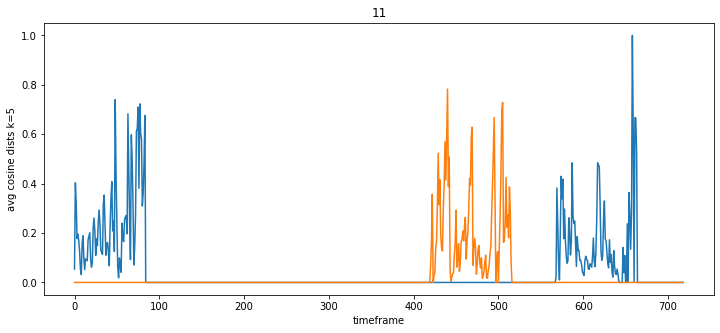

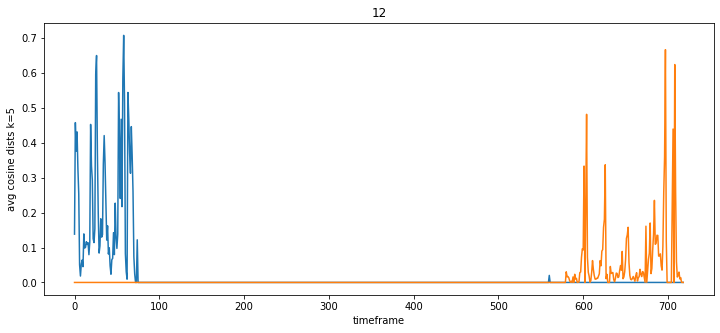

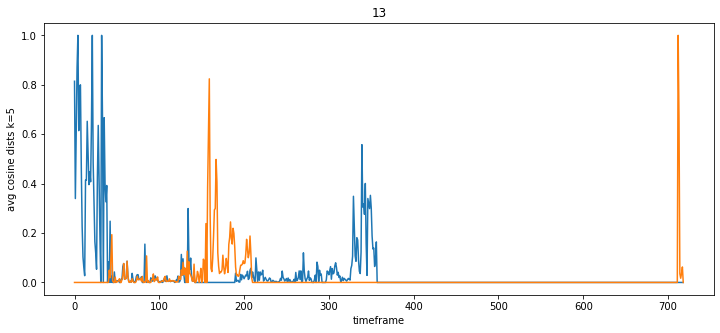

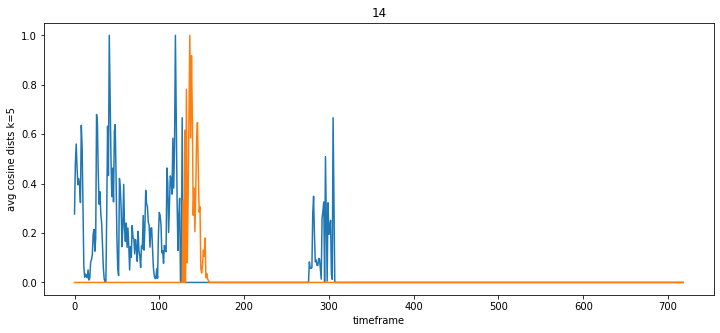

KeyboardInterrupt: 

In [7]:


def compute_avg_min_cosine_distances(data, timeframe, k):
    """
    Compute the average minimal cosine distance to the nearest k patterns 
    for each pattern to preceding and following patterns within a timeframe.

    Args:
        data (np.ndarray): Array of shape (n_timepoints, n_pixels).
        timeframe (int): The number of timepoints to consider before and after.
        k (int): Number of nearest patterns to average.

    Returns:
        tuple: Two arrays of shape (n_timepoints,) containing the average minimal cosine 
               distances to preceding and following patterns for each timepoint.
    """
    n_timepoints, _ = data.shape
    
    # Initialize arrays to store average minimal distances
    avg_min_dist_to_preceding = np.full(n_timepoints, np.inf)
    avg_min_dist_to_following = np.full(n_timepoints, np.inf)
    
    for t in range(n_timepoints):
        # Compute distances to preceding patterns within the timeframe
        preceding_distances = []
        for tp in range(max(0, t - timeframe), t):
            distance = cosine(data[t], data[tp])
            preceding_distances.append(distance)
        
        # Take the average of the smallest k distances
        if preceding_distances:
            k_smallest_preceding = nsmallest(k, preceding_distances)
            avg_min_dist_to_preceding[t] = np.mean(k_smallest_preceding)
        
        # Compute distances to following patterns within the timeframe
        following_distances = []
        for tf in range(t + 1, min(n_timepoints, t + timeframe + 1)):
            distance = cosine(data[t], data[tf])
            following_distances.append(distance)
        
        # Take the average of the smallest k distances
        if following_distances:
            k_smallest_following = nsmallest(k, following_distances)
            avg_min_dist_to_following[t] = np.mean(k_smallest_following)
    
    return avg_min_dist_to_preceding, avg_min_dist_to_following

threshold = 0.35

for i in range(20):
    thresholded_data_array = load_data[i]['files'][0]['data'][::5].copy()
    thresholded_data_array[thresholded_data_array < threshold] = 0
    min_preceding, min_following = compute_avg_min_cosine_distances(thresholded_data_array, timeframe=150, k=3)

    plt.figure(figsize=(12, 5))
    plt.plot(min_preceding[1:])
    plt.plot(min_following[:-1])
    plt.ylabel('avg cosine dists k=5')
    plt.xlabel('timeframe')
    plt.title(i)
    plt.show()

    #plt.figure(figsize=(12, 5))
    #plt.plot(min_preceding[1:] - min_following[:-1])
    #plt.ylabel('avg cosine dists k=5 / diff pre - post')
    #plt.xlabel('timeframe')
    #plt.show()

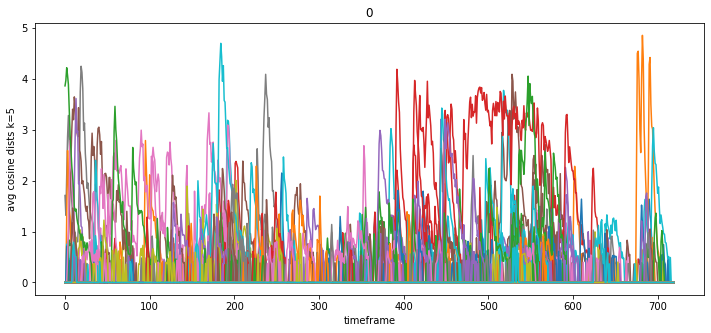

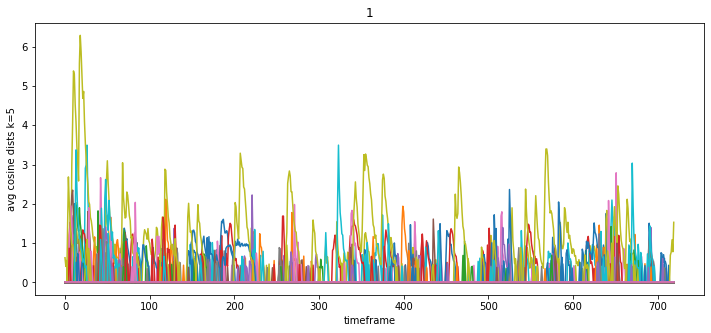

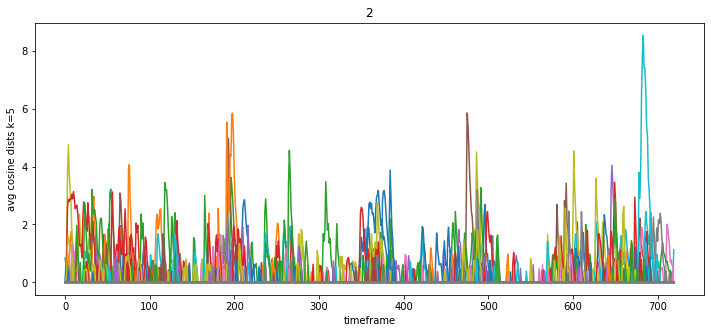

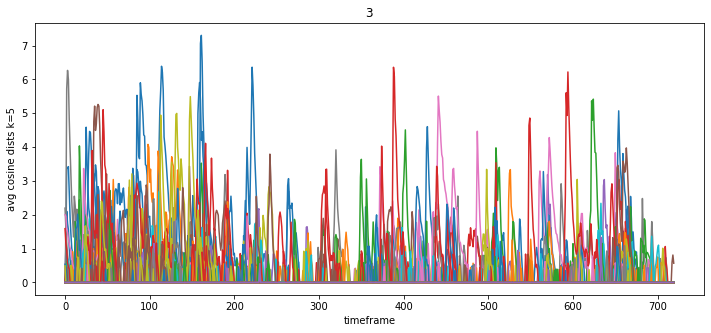

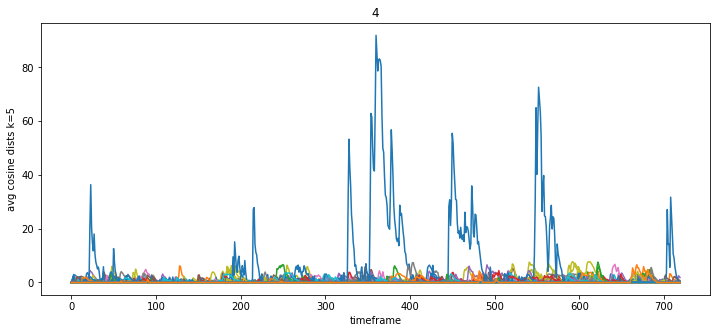

...

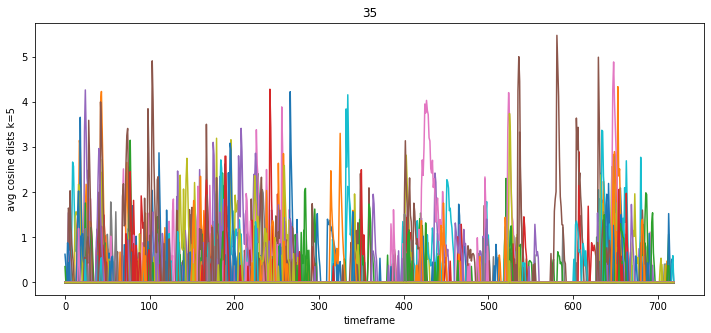

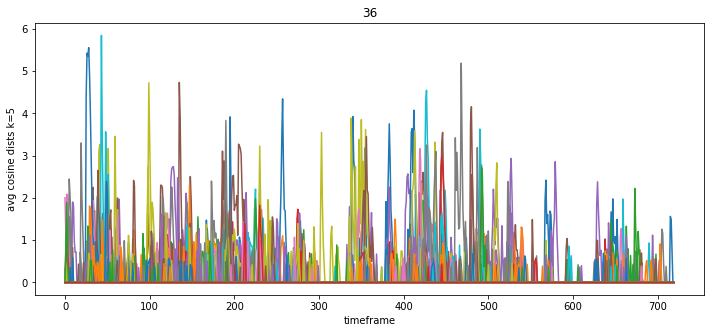

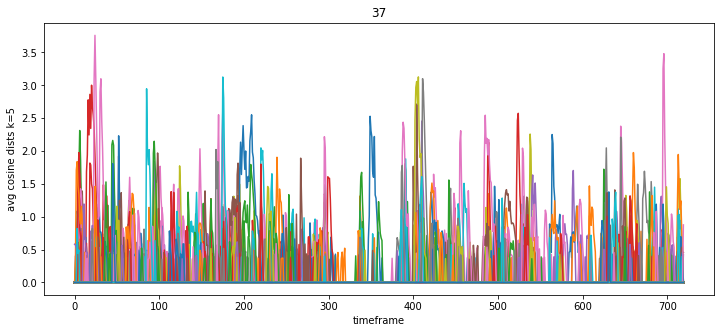

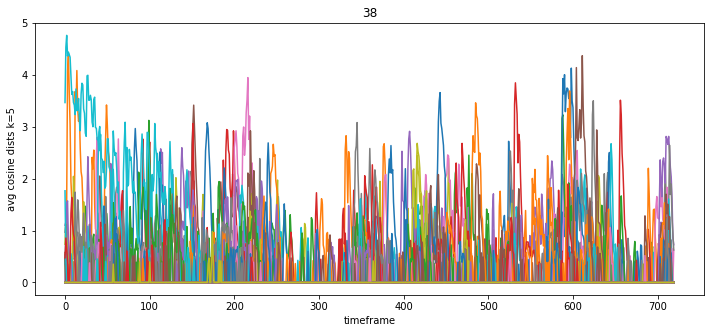

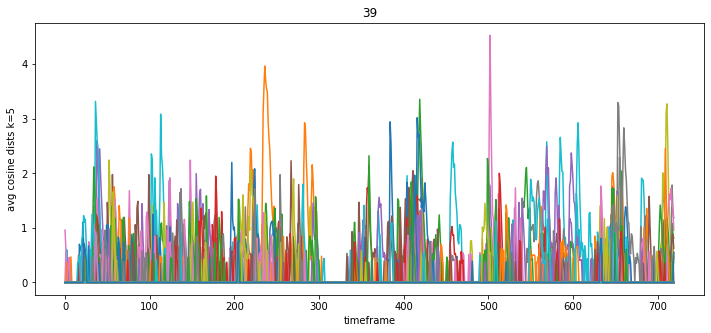

In [8]:
for i in range(40):
    thresholded_data_array = load_data[i]['files'][0]['data'][::5].copy()
    thresholded_data_array[thresholded_data_array < threshold] = 0

    plt.figure(figsize=(12, 5))
    plt.plot(thresholded_data_array)
    plt.ylabel('avg cosine dists k=5')
    plt.xlabel('timeframe')
    plt.title(i)
    plt.show()

In [14]:
movie_1 = np.load('natural_movie_one.npy')
movie_3 = np.load('natural_movie_three.npy')

print(movie_1.shape)
print(movie_3.shape)

movie_1_flat = movie_1.reshape(movie_1.shape[0],-1)
movie_3_flat = movie_3.reshape(movie_3.shape[0],-1)



(900, 304, 608)
(3600, 304, 608)


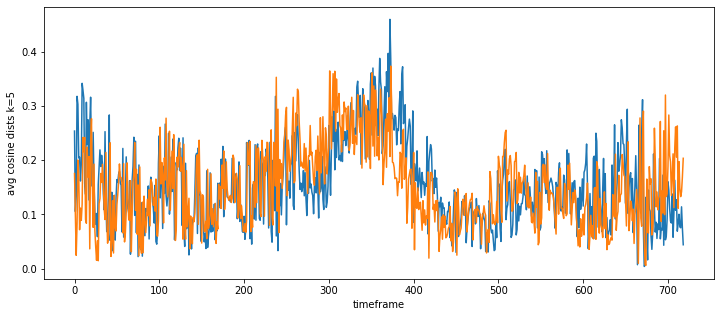

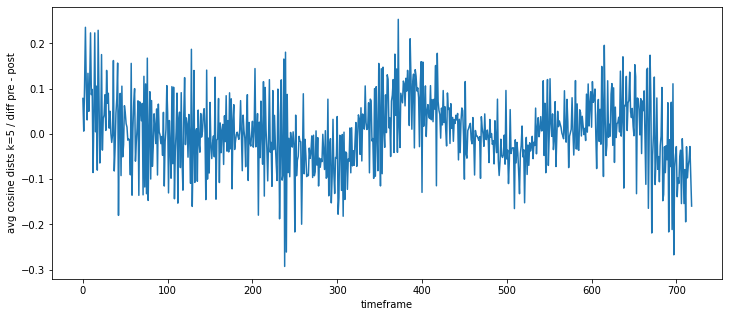

In [10]:
min_preceding, min_following = compute_avg_min_cosine_distances(movie_3_flat[::5,::20], timeframe=80, k=10)
plt.figure(figsize=(12, 5))
plt.plot(min_preceding[1:])
plt.plot(min_following[:-1])
plt.ylabel('avg cosine dists k=5')
plt.xlabel('timeframe')
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(min_preceding[1:] - min_following[:-1])
plt.ylabel('avg cosine dists k=5 / diff pre - post')
plt.xlabel('timeframe')
plt.show()

In [9]:
from scipy.stats import multivariate_normal

def create_gauss(X, n_samples):
    """
    Method to create control data sampled from a gaussian distribution based on covariance of data
    Parametres:
        X (np.array): data array with shape (number_pixels, number_time_frames)
        n_samples (int): number of synthetic data points

    Returns:
    - Y (np.array): synthetically created control data
    """

    # Compute the mean vector (average over timepoints for each variable)
    mean = np.mean(X, axis=1)
    # Compute the covariance matrix (pairwise covariance between variables)
    covariance = np.cov(X)

    # Create a multivariate normal distribution object
    mvn = multivariate_normal(mean=mean, cov=covariance, allow_singular=True)

    Y = mvn.rvs(size=n_samples).T  # Transpose to match (number_pixels, n_samples)

    return Y

def shuffle_along_axis(array, axis):
    """
    Shuffle a NumPy array along a specified axis.

    Parameters:
    array (numpy.ndarray): The input array to shuffle.
    axis (int): The axis along which to shuffle.

    Returns:
    numpy.ndarray: The shuffled array.
    """
    # Create an array of indices along the specified axis
    indices = np.arange(array.shape[axis])
    # Shuffle the indices
    np.random.shuffle(indices)
    # Generate slices for advanced indexing
    slices = [slice(None)] * array.ndim
    slices[axis] = indices
    # Apply the shuffled indices to the array
    shuffled_array = array[tuple(slices)]
    return shuffled_array

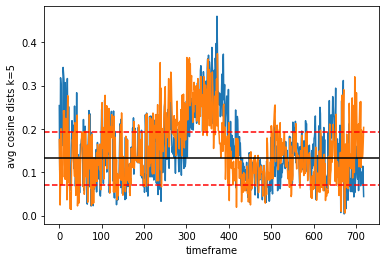

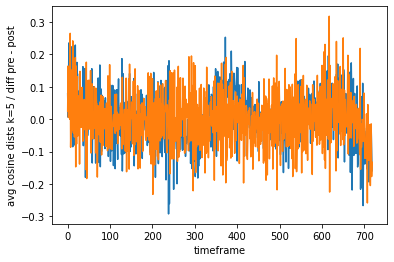

In [15]:
#control_gauss_data = create_gauss(movie_3_flat[::10,::200].T, n_samples=1000)
#min_preceding, min_following = compute_avg_min_cosine_distances(control_gauss_data.T, timeframe, k=5)
min_preceding_shuffle, min_following_shuffle = compute_avg_min_cosine_distances(shuffle_along_axis(movie_3_flat[::5,::20], axis=0), timeframe, k=5)

plt.plot(min_preceding[1:])
plt.plot(min_following[:-1])
plt.axhline(np.mean(min_preceding_shuffle[1:]), color='black', linestyle='-', )
plt.axhline(np.mean(min_preceding_shuffle[1:]) + np.std(min_preceding_shuffle[1:]), color='red', linestyle='--', )
plt.axhline(np.mean(min_preceding_shuffle[1:]) - np.std(min_preceding_shuffle[1:]), color='red', linestyle='--',)
plt.ylabel('avg cosine dists k=5')
plt.xlabel('timeframe')
plt.show()

plt.plot(min_preceding[1:] - min_following[:-1])
plt.plot(min_preceding_shuffle[1:] - min_following_shuffle[:-1])
plt.ylabel('avg cosine dists k=5 / diff pre - post')
plt.xlabel('timeframe')
plt.show()

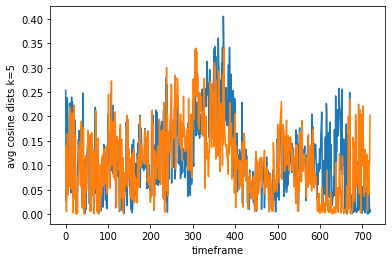

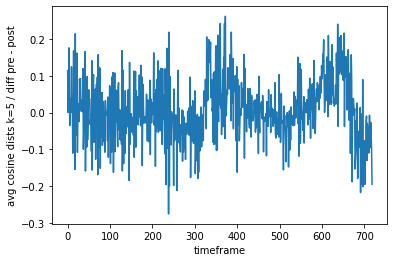

In [70]:
def swap_items(array, index1, index2):
    """
    Swap two items in an array at the specified indices.

    Parameters:
    array (list or numpy.ndarray): The input array.
    index1 (int): The index of the first item to swap.
    index2 (int): The index of the second item to swap.

    Returns:
    None: The function swaps the items in place.
    """
    if not (0 <= index1 < len(array)) or not (0 <= index2 < len(array)):
        raise IndexError("Index out of range.")
        
    # Create a copy of the array
    new_array = array.copy() if isinstance(array, np.ndarray) else array[:]
    
    # Swap the items in the new array
    new_array[index1], new_array[index2] = new_array[index2], new_array[index1]
    
    return new_array
    
min_preceding, min_following = compute_min_cosine_distances(swap_items(movie_3_flat[::5,::20], 150,550), timeframe)

plt.plot(min_preceding[1:])
plt.plot(min_following[:-1])
plt.ylabel('avg cosine dists k=5')
plt.xlabel('timeframe')
plt.show()

plt.plot(min_preceding[1:] - min_following[:-1])
plt.ylabel('avg cosine dists k=5 / diff pre - post')
plt.xlabel('timeframe')
plt.show()

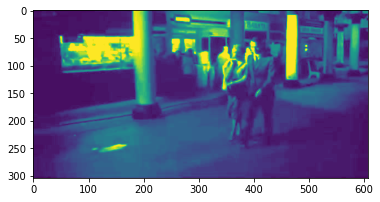

In [23]:
plt.imshow(movie_3[5*100])

In [15]:


fishers = FisherS()
fishers = fishers.fit_pw(movie_3_flat[::5,::20])
pw_ids = fishers.transform_pw(movie_3_flat[::5,::20])


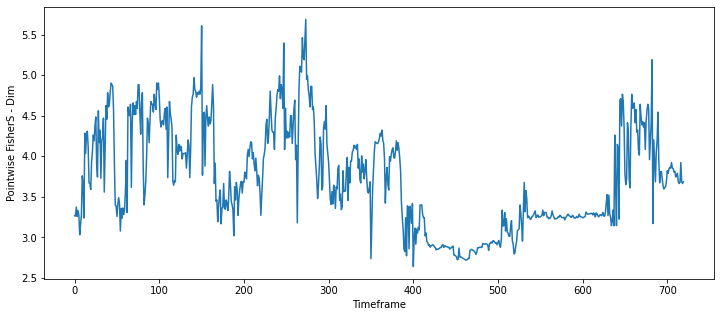

In [16]:
plt.figure(figsize=(12, 5))
plt.plot(pw_ids)
plt.ylabel('Pointwise FisherS - Dim')
plt.xlabel('Timeframe')
plt.show()

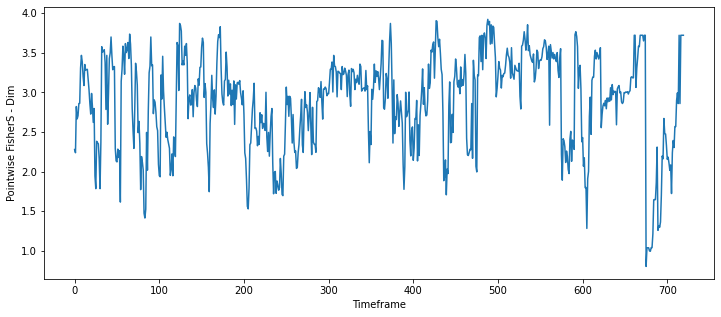

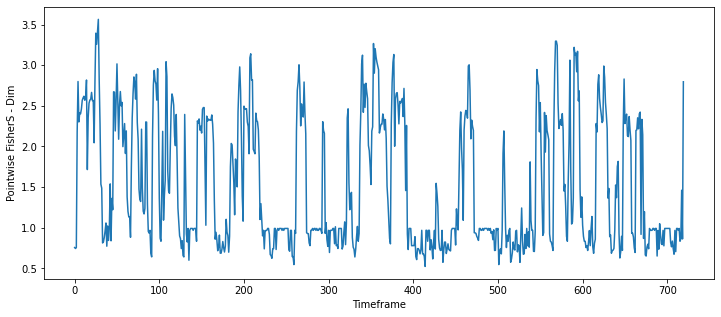

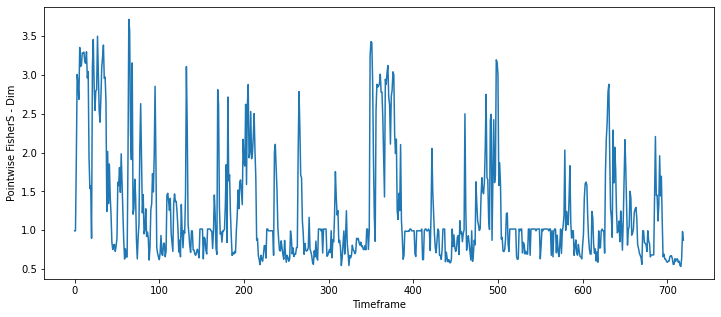

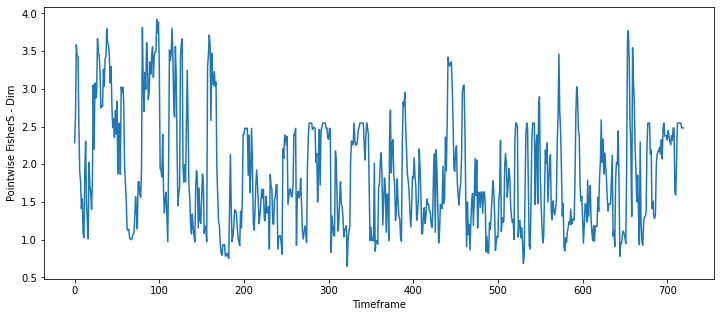

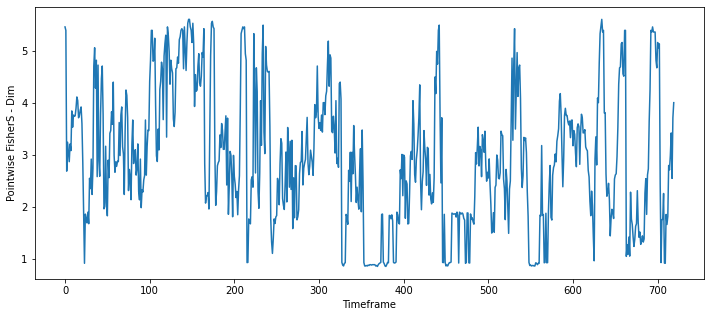

...

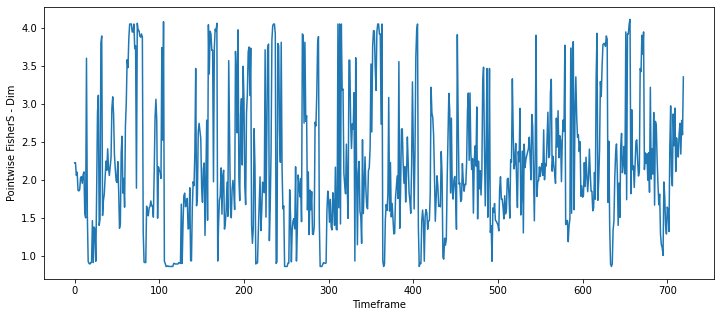

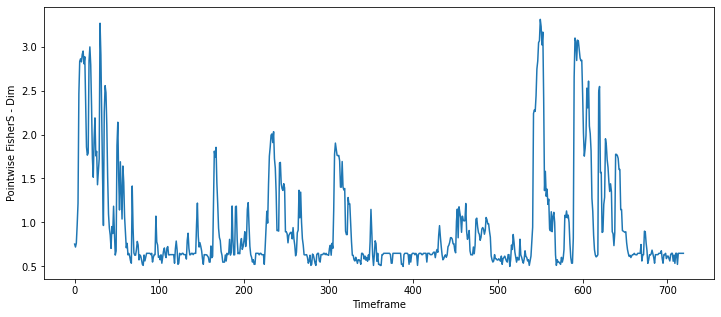

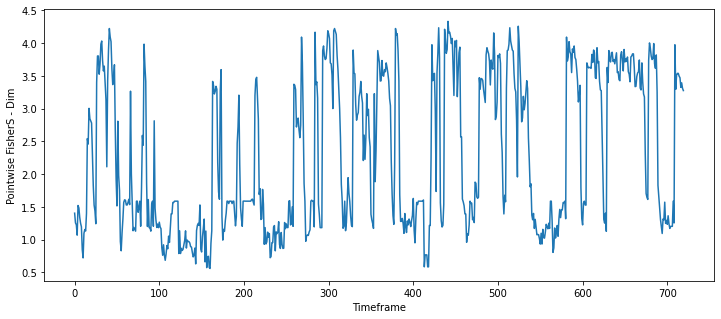

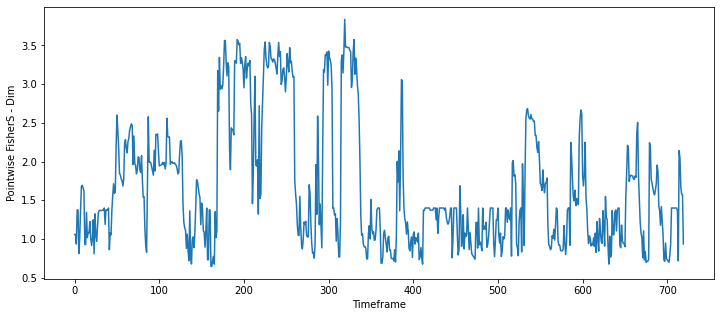

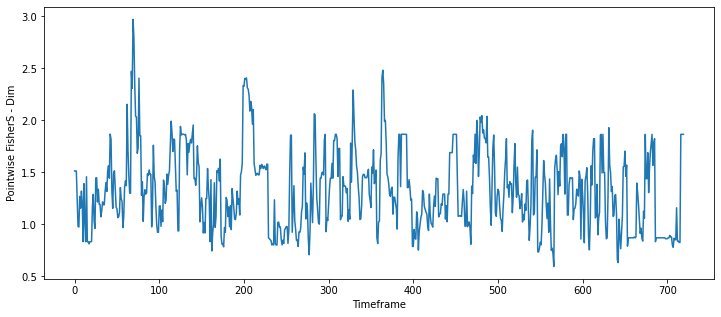

In [6]:
threshold = 0.35

for i in range(15):
    
    thresholded_data_array = load_data[i]['files'][0]['data'][::5].copy()
    thresholded_data_array[thresholded_data_array < threshold] = 0
    
    fishers = FisherS()
    fishers = fishers.fit_pw(thresholded_data_array)
    pw_ids = fishers.transform_pw(thresholded_data_array)
    
    plt.figure(figsize=(12, 5))
    plt.plot(pw_ids)
    plt.ylabel('Pointwise FisherS - Dim')
    plt.xlabel('Timeframe')
    plt.show()

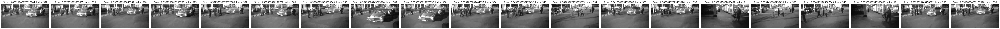

In [31]:
top_n = 20
scores = min_preceding[1:]

top_indices = np.argsort(scores)[-top_n:][::-1]
    
# Select the corresponding images and scores
top_images = movie_3[5*top_indices]
top_scores = scores[top_indices]

# Plot the images
plt.figure(figsize=(80, 40))
for i, (img, score, index) in enumerate(zip(top_images, top_scores, top_indices)):
    plt.subplot(1, top_n, i + 1)
    if img.ndim == 2:  # Grayscale image
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.title(f"Score: {score}  Index: {index}")
    plt.axis('off')

plt.tight_layout()
plt.show()

510


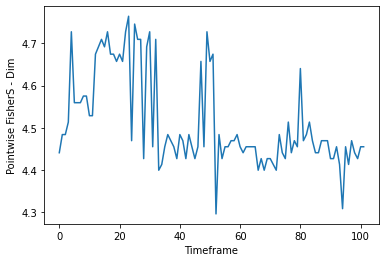

525


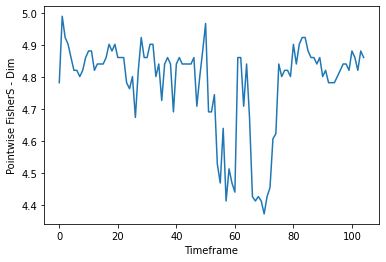

540


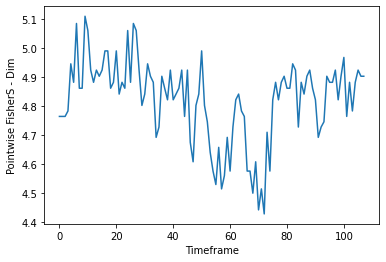

555


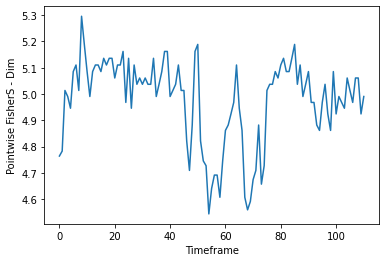

570


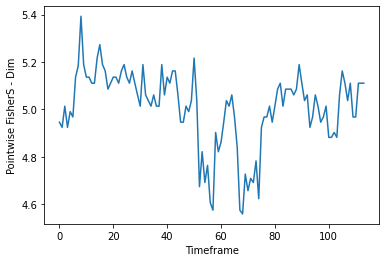

585


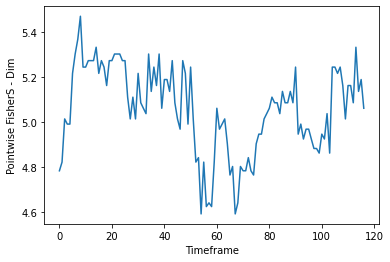

600


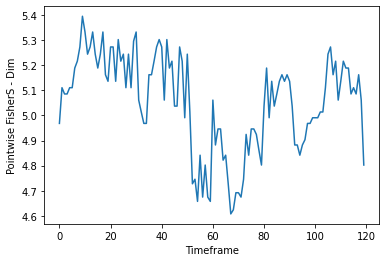

615


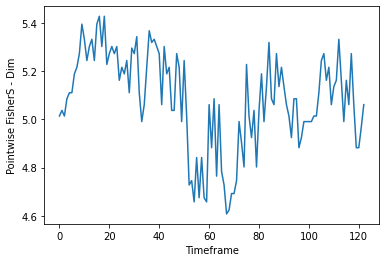

630


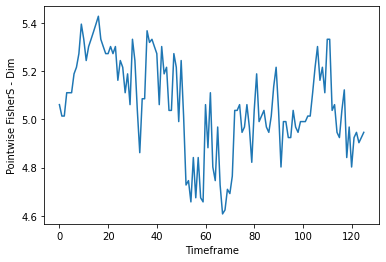

645


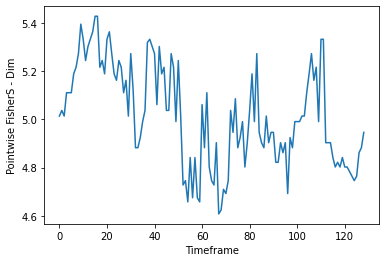

660


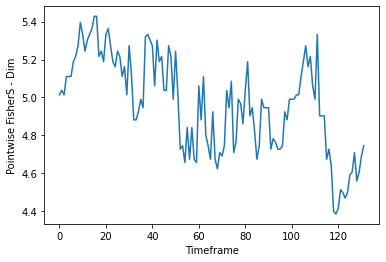

675


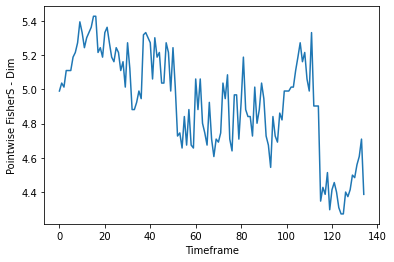

690


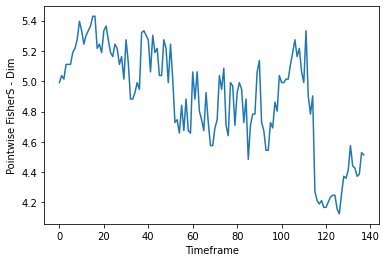

705


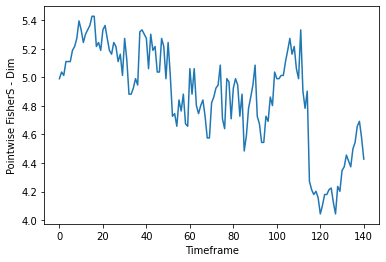

720


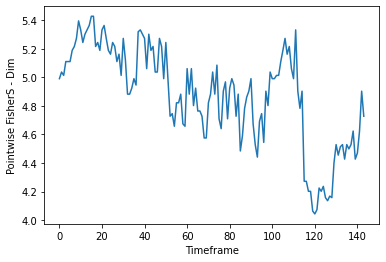

735


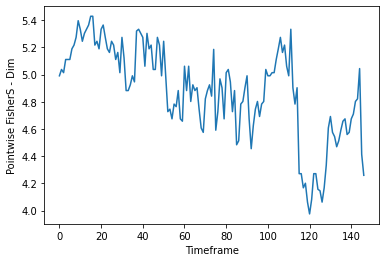

750


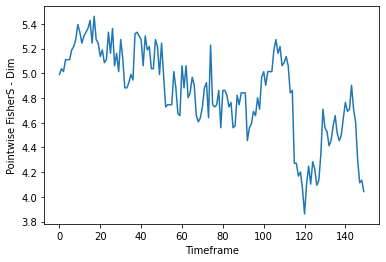

765


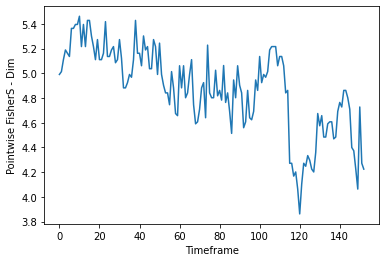

780


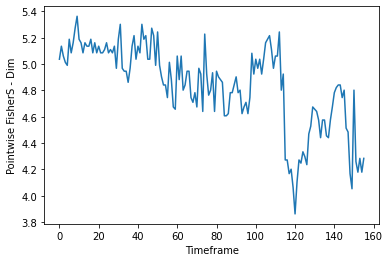

795


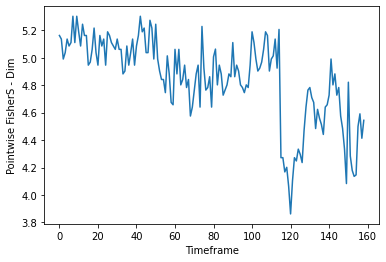

810


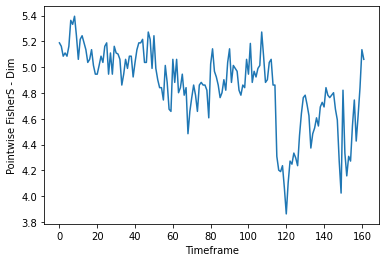

825


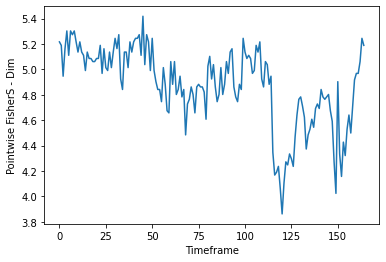

840


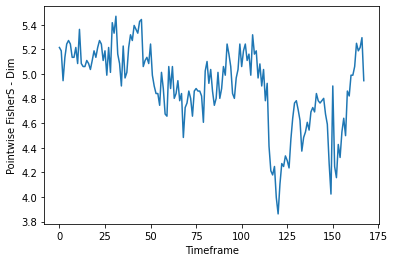

855


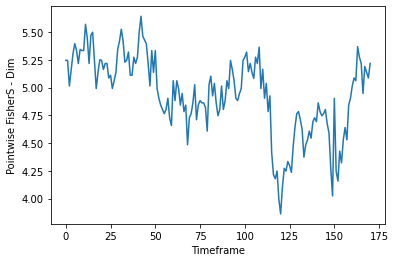

870


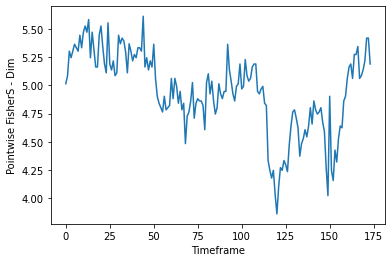

885


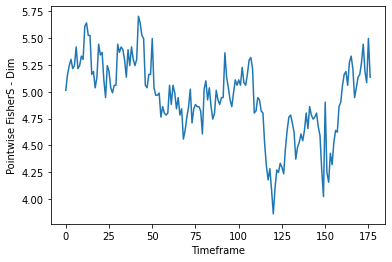

900


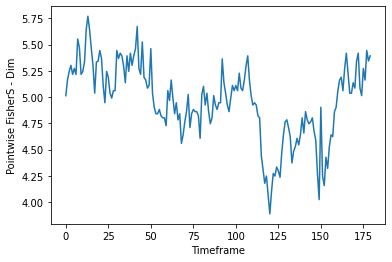

915


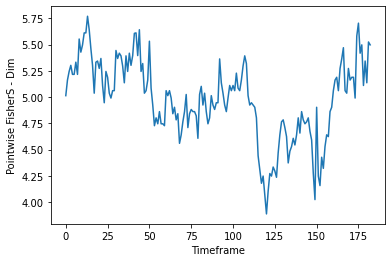

930


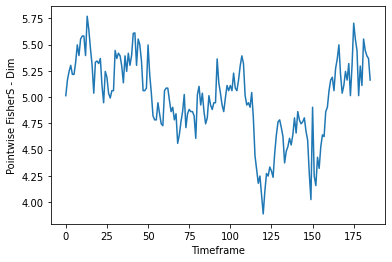

945


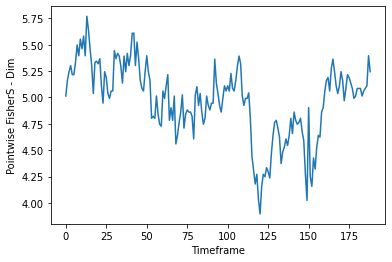

960


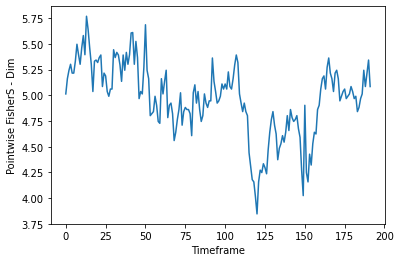

975


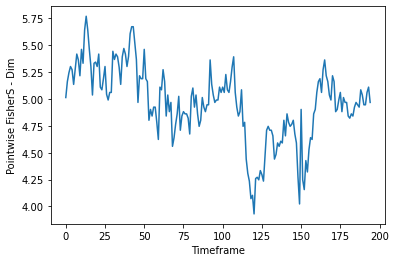

990


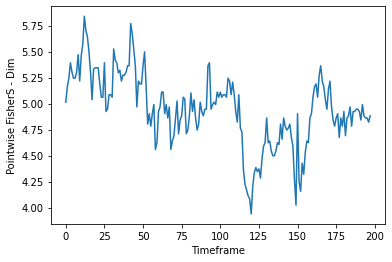

1005


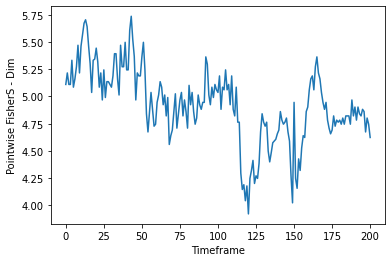

1020


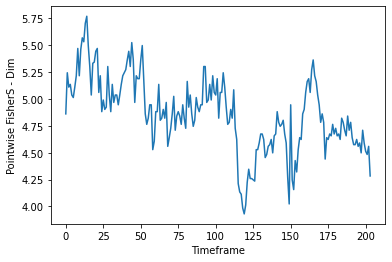

1035


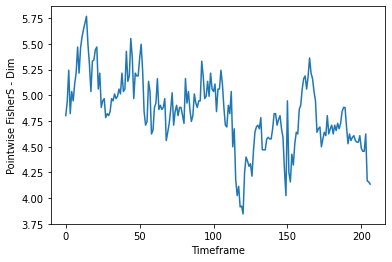

1050


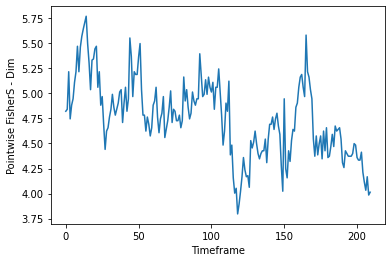

1065


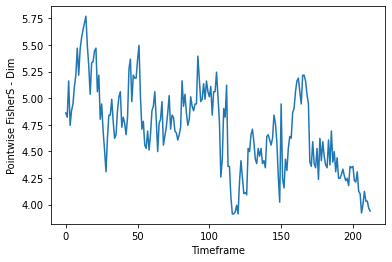

1080


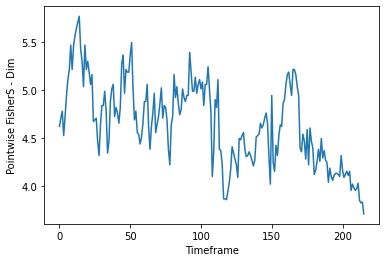

1095


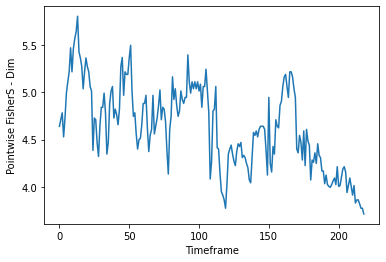

1110


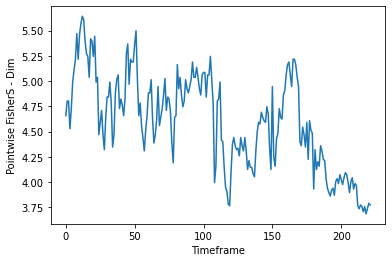

1125


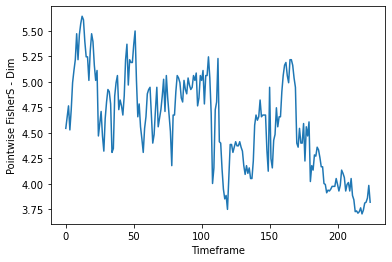

1140


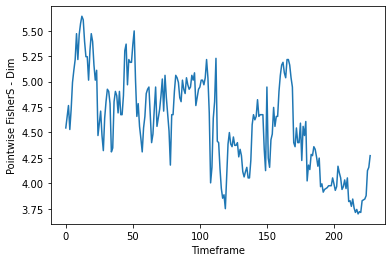

1155


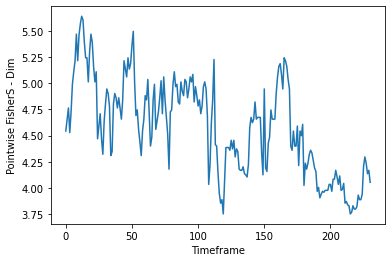

1170


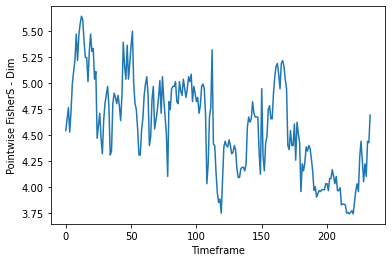

1185


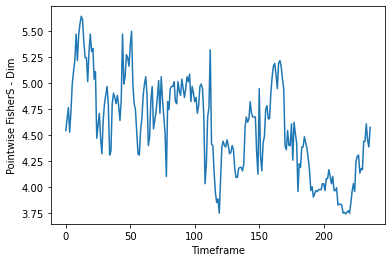

1200


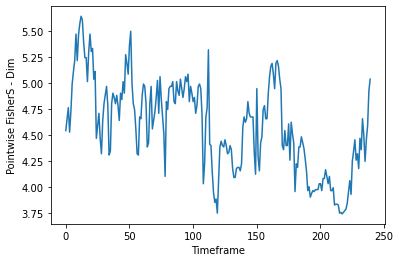

1215


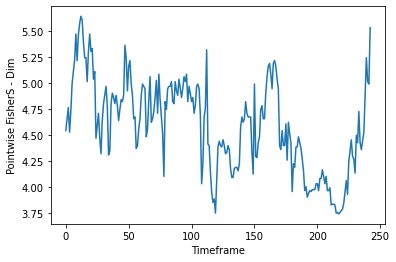

1230


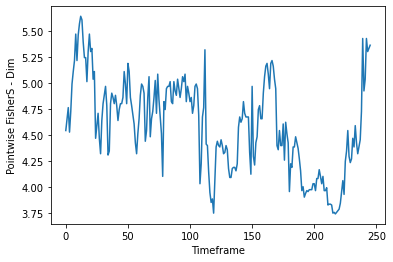

1245


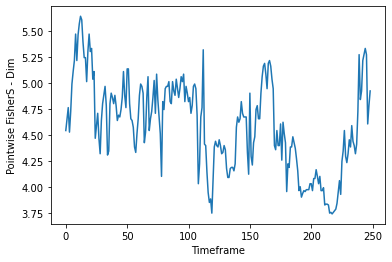

1260


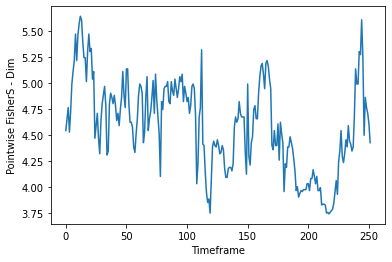

1275


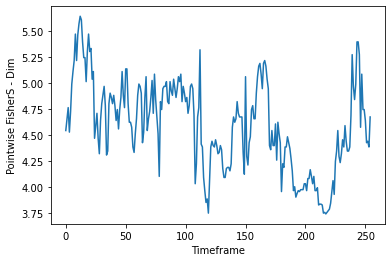

1290


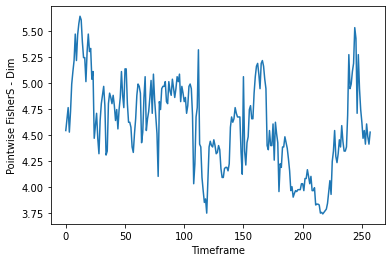

1305


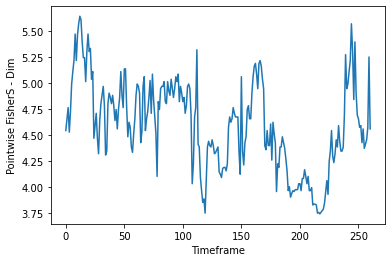

1320


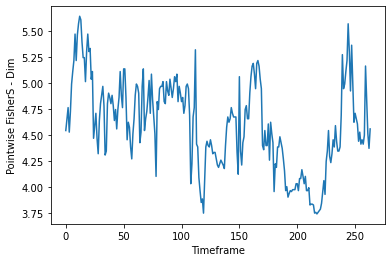

1335


KeyboardInterrupt: 

In [36]:

for i in range(510,8000,15):
    print(i)
    fishers = fishers.fit_pw(movie_3_flat[:i:5,::40])
    pw_ids = fishers.transform_pw(movie_3_flat[:i:5,::40])
    plt.plot(pw_ids)
    plt.ylabel('Pointwise FisherS - Dim')
    plt.xlabel('Timeframe')
    plt.show()